<a href="https://colab.research.google.com/github/emonroy2024/Analysis_25/blob/main/Single_Image_Shift.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Shift Tranformation X Axis

In [ ]:
# Cell 25: X-axis Shift Transformation (Periodic Shift)

import os
import numpy as np
import cv2
from tensorflow.keras.utils import img_to_array, array_to_img, load_img

def shift_x_image_periodic(img_path, shift, save_dir="shifted_x_images"):
    """Applies periodic X-axis shift to an image."""
    # Load image
    img = load_img(img_path)
    img_array = img_to_array(img)

    # Get image dimensions
    h, w, _ = img_array.shape

    # Apply periodic shift using numpy roll
    shifted_img_array = np.roll(img_array, shift, axis=1)  # Shift along X-axis

    # Convert back to PIL image
    shifted_img = array_to_img(shifted_img_array)

    # Save shifted image
    os.makedirs(save_dir, exist_ok=True)
    save_path = os.path.join(save_dir, f"shifted_x_{shift}.jpg")
    shifted_img.save(save_path)

    return shifted_img, save_path

# Define shift range
shift_values = np.arange(-180, 181, 30)  # Shift from -180 to +180 pixels in steps of 30
shifted_images = []  # Store (shift, shifted_image, shifted_path)

# Apply periodic shift for each value
for shift in shift_values:
    shifted_img, shifted_img_path = shift_x_image_periodic(img_path, shift)
    shifted_images.append((shift, shifted_img, shifted_img_path))

print(f"Generated {len(shifted_images)} periodically shifted images along the X-axis.")


Generated 13 periodically shifted images along the X-axis.


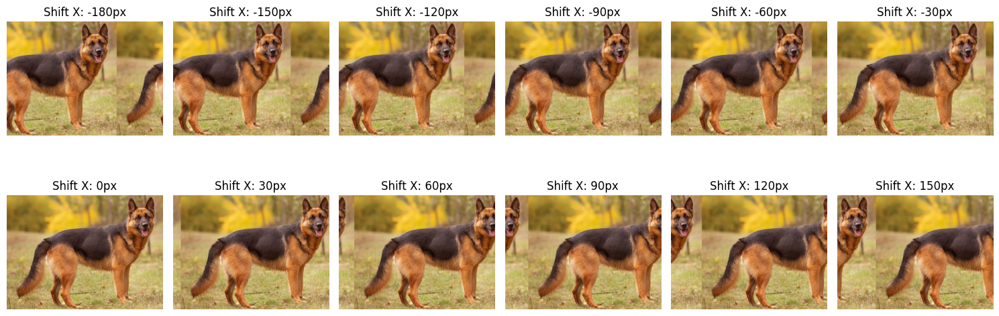

In [ ]:
# Cell 26: Display Shifted Images
fig, axes = plt.subplots(2, len(shifted_images)//2, figsize=(15, 6))

for ax, (shift, shifted_img, _) in zip(axes.flatten(), shifted_images):
    ax.imshow(shifted_img)
    ax.set_title(f"Shift X: {shift}px")
    ax.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


<ipython-input-30-040105b12408>:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = mpl.cm.get_cmap("jet")


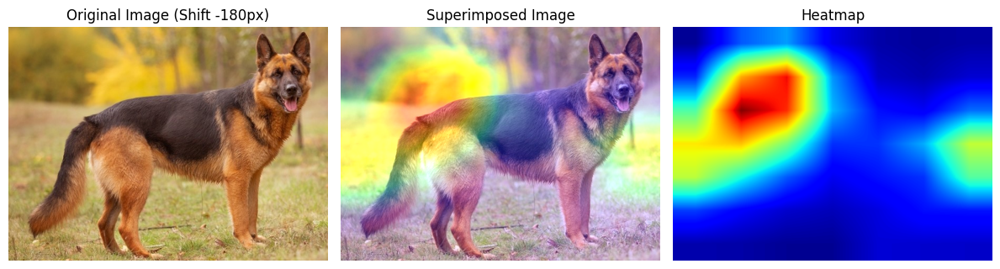

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


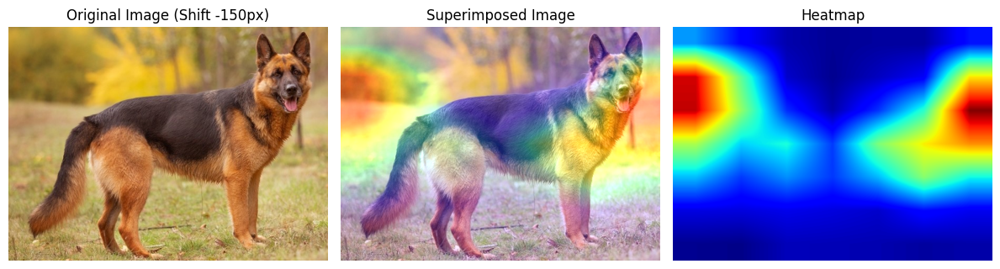

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


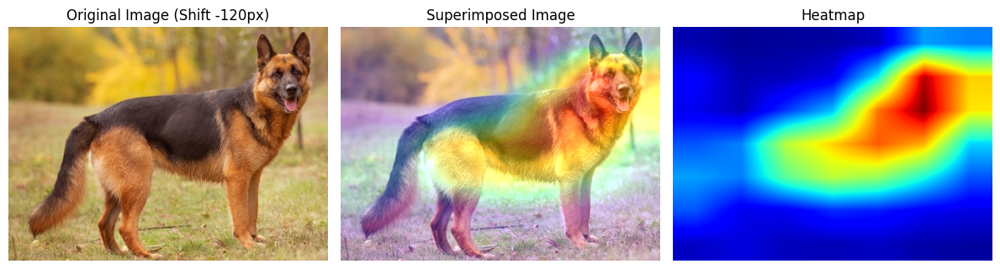

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


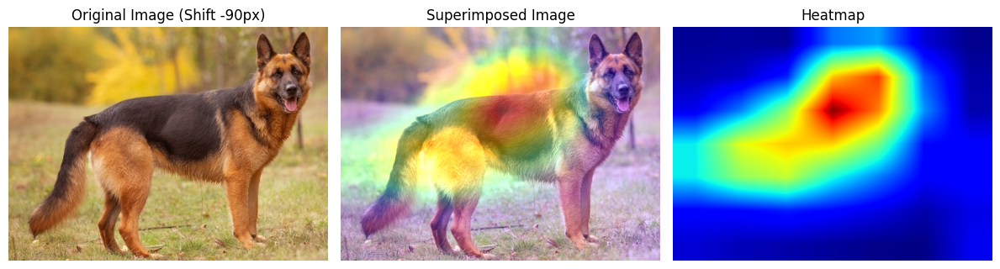

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


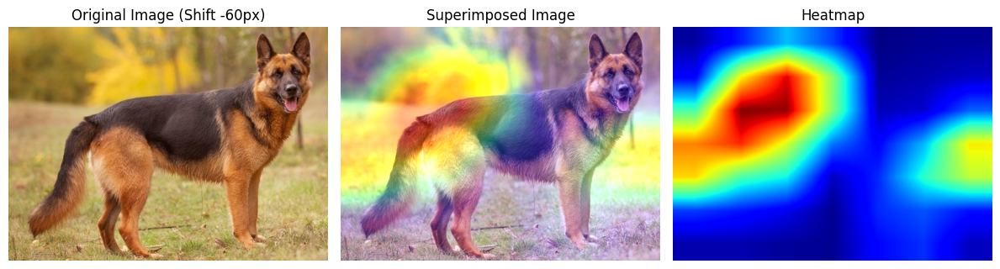

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


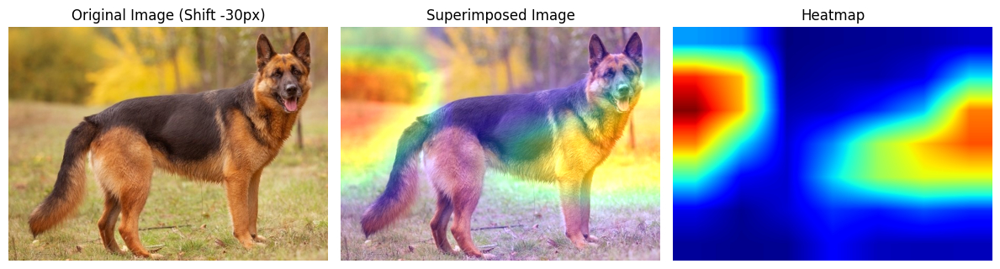

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


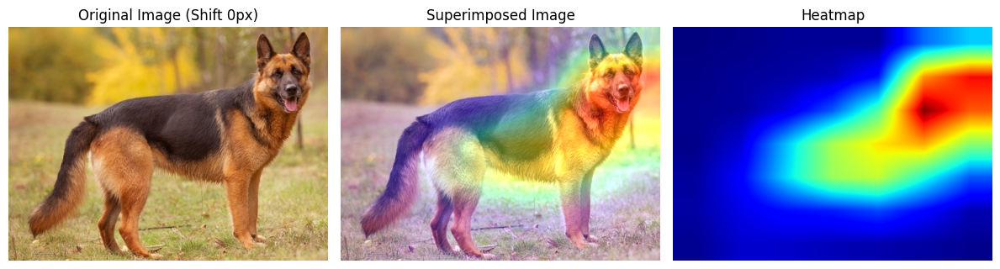

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


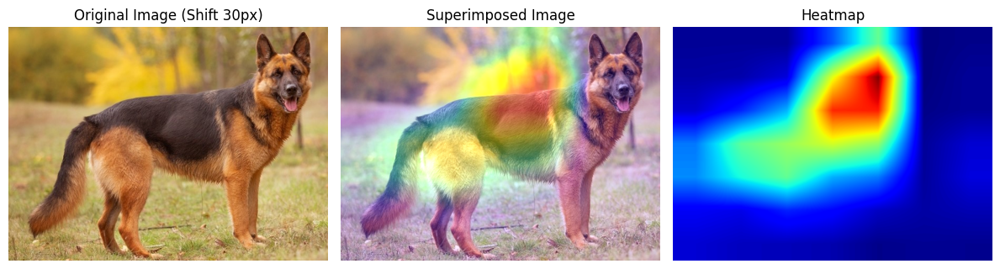

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


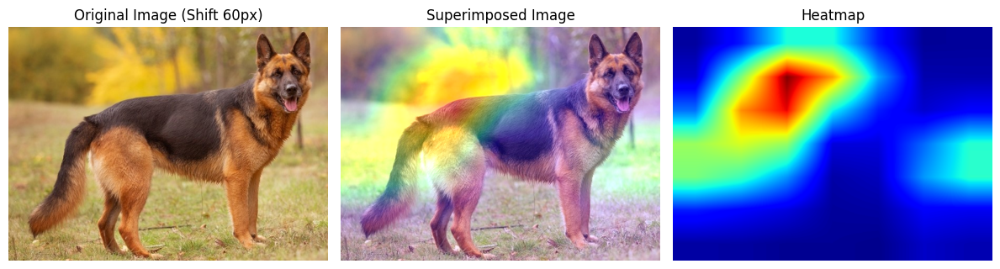

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


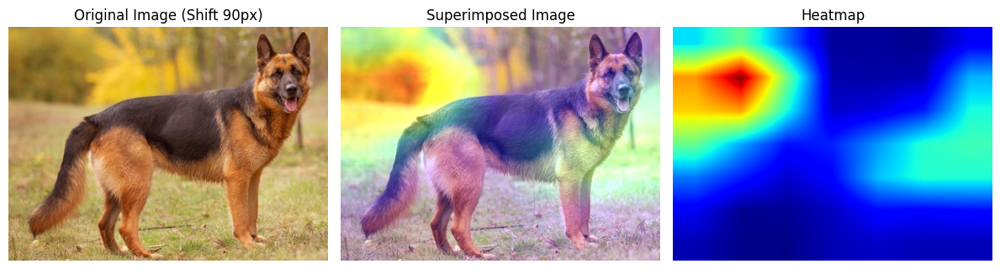

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


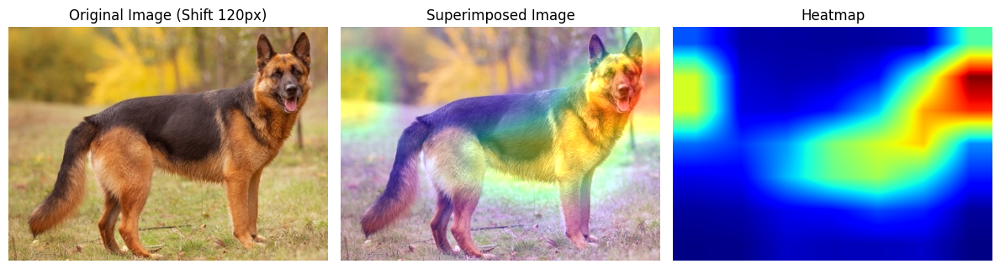

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


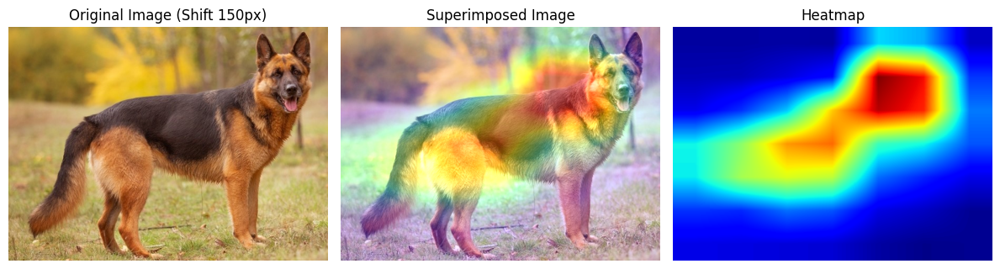

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


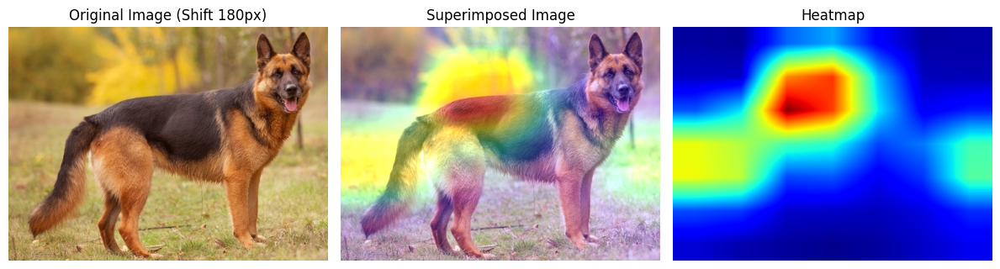

In [ ]:
# Cell 27: Display Periodically Shifted Images with Grad-CAM

import cv2

def display_all_shifted_images(shifted_images):
    for shift, _, shifted_img_path in shifted_images:
        # Load and preprocess the shifted image
        shifted_img_array = preprocess_input(get_img_array(shifted_img_path, size=img_size))

        # Generate predictions
        preds = model.predict(shifted_img_array)
        pred_class = np.argmax(preds[0])  # Get predicted class

        # Generate Grad-CAM heatmap for the predicted class
        heatmap = make_gradcam_heatmap(shifted_img_array, model, last_conv_layer_name, pred_index=pred_class)

        # Shift the heatmap back to original alignment using np.roll for periodic shift
        aligned_heatmap = np.roll(heatmap, -shift, axis=1)  # Shift back along X-axis

        # Normalize the heatmap properly
        aligned_heatmap = np.maximum(aligned_heatmap, 0)  # Remove negatives
        aligned_heatmap /= np.max(aligned_heatmap) if np.max(aligned_heatmap) > 0 else 1

        # Load original image
        img = keras.utils.load_img(img_path)
        img = keras.utils.img_to_array(img)

        # Resize heatmap to match image size
        heatmap_resized = cv2.resize(aligned_heatmap, (img.shape[1], img.shape[0]))

        # Convert heatmap to proper format for visualization
        heatmap_rescaled = np.uint8(255 * heatmap_resized)

        # Apply proper colormap
        jet = mpl.cm.get_cmap("jet")
        jet_colors = jet(np.arange(256))[:, :3]  # Extract RGB values
        jet_heatmap = jet_colors[heatmap_rescaled]  # Map to colorized heatmap

        # Convert heatmap to PIL image format
        jet_heatmap = keras.utils.array_to_img(jet_heatmap)
        jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
        jet_heatmap = keras.utils.img_to_array(jet_heatmap)

        # **Fix: Ensure correct scaling before overlay**
        superimposed_img = (jet_heatmap * 0.4) + img
        superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

        # Display images side by side
        fig, axes = plt.subplots(1, 3, figsize=(12, 6))

        axes[0].imshow(keras.utils.array_to_img(img))
        axes[0].set_title(f"Original Image (Shift {shift}px)")
        axes[0].axis("off")

        axes[1].imshow(array_to_img(superimposed_img))
        axes[1].set_title("Superimposed Image")
        axes[1].axis("off")

        axes[2].imshow(array_to_img(jet_heatmap))
        axes[2].set_title("Heatmap")
        axes[2].axis("off")

        plt.tight_layout()
        plt.show()

# Call function to display all shifted images with heatmaps
display_all_shifted_images(shifted_images)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


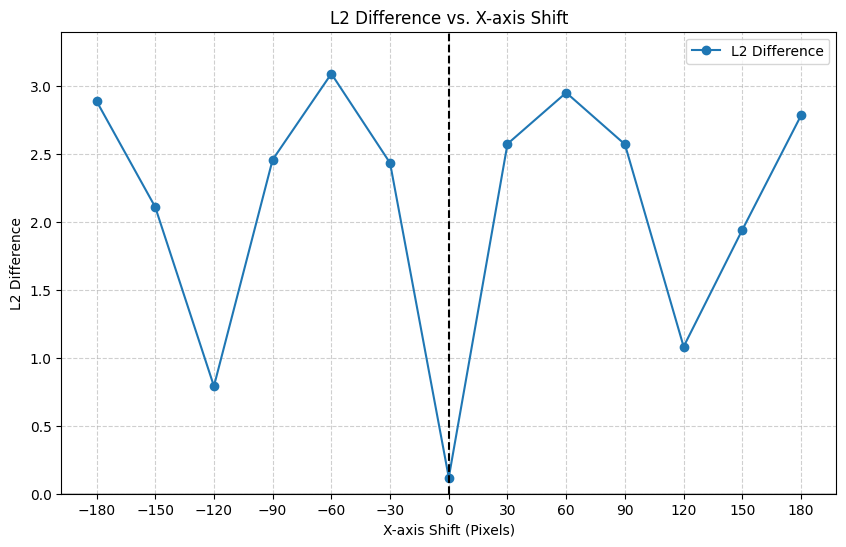

In [ ]:
# Cell 28: Compute L2 Difference Between Shifted and Original Heatmaps

import numpy as np
import cv2
import matplotlib.pyplot as plt

# Normalize heatmap function
def normalize_heatmap(heatmap):
    heatmap = np.maximum(heatmap, 0)  # Remove negatives
    if np.max(heatmap) > 0:
        heatmap /= np.max(heatmap)  # Scale between 0 and 1
    return heatmap

# Compute original heatmap (Baseline without shift)
original_heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=235)  # Horig
original_heatmap = normalize_heatmap(original_heatmap)

# Compute L2 Differences
l2_differences = []
shift_values = []

for shift, _, shifted_img_path in shifted_images:
    # Load and preprocess the shifted image
    shifted_img_array = preprocess_input(get_img_array(shifted_img_path, size=img_size))

    # Generate Grad-CAM heatmap for the predicted class
    preds = model.predict(shifted_img_array)
    pred_class = np.argmax(preds[0])  # Get predicted class
    shifted_heatmap = make_gradcam_heatmap(shifted_img_array, model, last_conv_layer_name, pred_index=pred_class)
    shifted_heatmap = normalize_heatmap(shifted_heatmap)  # Normalize

    # Align shifted heatmap back to original orientation using np.roll
    aligned_heatmap = np.roll(shifted_heatmap, -shift, axis=1)  # Shift back along X-axis

    # Ensure heatmap size consistency
    aligned_heatmap = cv2.resize(aligned_heatmap, (original_heatmap.shape[1], original_heatmap.shape[0]))

    # Compute L2 difference
    l2_diff = np.linalg.norm(original_heatmap - aligned_heatmap)
    l2_differences.append(l2_diff)
    shift_values.append(shift)

# Step 5: Visualize Results - L2 Difference vs X-axis Shift
plt.figure(figsize=(10, 6))
plt.plot(shift_values, l2_differences, marker='o', linestyle='-', label='L2 Difference')

plt.xlabel("X-axis Shift (Pixels)")
plt.ylabel("L2 Difference")
plt.title("L2 Difference vs. X-axis Shift")
plt.xticks(shift_values)
plt.ylim(0, max(l2_differences) * 1.1)  # Ensure Y-axis starts at 0
plt.axhline(y=0, color='black', linewidth=1)  # Ground Y-axis at 0
plt.axvline(x=0, color='black', linestyle='--')  # Reference for original shift
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


<ipython-input-32-809bcc4ed0e3>:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = mpl.cm.get_cmap("jet")


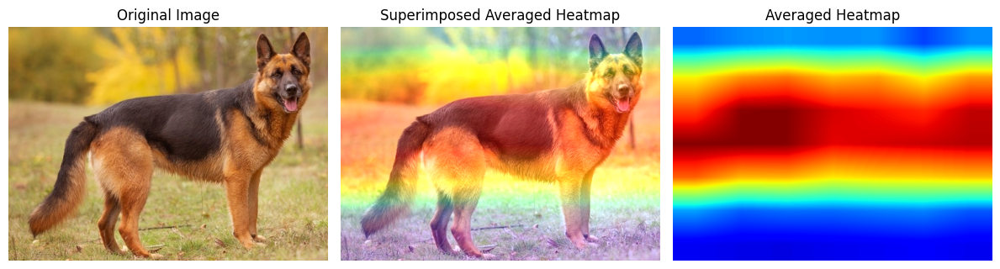

In [ ]:
# Cell 29: Compute Average Heatmaps from Shifted Images

import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.utils import img_to_array, array_to_img, load_img

def average_heatmaps_and_apply(shifted_images, img_path):
    # Load original image
    img = load_img(img_path)
    img_array = img_to_array(img)

    # Initialize accumulator for heatmaps (same size as input image)
    heatmap_accum = np.zeros((img_size[0], img_size[1]), dtype=np.float32)
    count = 0  # Track number of heatmaps

    for shift, _, shifted_img_path in shifted_images:
        # Load and preprocess shifted image
        shifted_img_array = preprocess_input(get_img_array(shifted_img_path, size=img_size))

        # Generate predictions
        preds = model.predict(shifted_img_array)
        pred_class = np.argmax(preds[0])  # Get predicted class

        # Generate Grad-CAM heatmap
        heatmap = make_gradcam_heatmap(shifted_img_array, model, last_conv_layer_name, pred_index=pred_class)

        # Align heatmap back using np.roll for periodic shift
        aligned_heatmap = np.roll(heatmap, -shift, axis=1)

        # Resize heatmap to match (224, 224)
        heatmap_resized = cv2.resize(aligned_heatmap, (img_size[1], img_size[0]))

        # Normalize heatmap
        heatmap_resized = np.maximum(heatmap_resized, 0)
        heatmap_resized /= np.max(heatmap_resized) if np.max(heatmap_resized) > 0 else 1

        # Accumulate heatmap
        heatmap_accum += heatmap_resized
        count += 1

    # Compute average heatmap
    average_heatmap = heatmap_accum / count
    average_heatmap /= np.max(average_heatmap) if np.max(average_heatmap) > 0 else 1  # Normalize again

    # Resize heatmap to match original image size
    heatmap_resized = cv2.resize(average_heatmap, (img_array.shape[1], img_array.shape[0]))

    # Apply colormap
    heatmap_rescaled = np.uint8(255 * heatmap_resized)
    jet = mpl.cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap_rescaled]

    # Convert to image
    jet_heatmap = img_to_array(array_to_img(jet_heatmap))

    # Superimpose averaged heatmap on original image
    superimposed_img = (jet_heatmap * 0.4) + img_array
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(12, 6))

    axes[0].imshow(array_to_img(img_array))
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(array_to_img(superimposed_img))
    axes[1].set_title("Superimposed Averaged Heatmap")
    axes[1].axis("off")

    axes[2].imshow(array_to_img(jet_heatmap))
    axes[2].set_title("Averaged Heatmap")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

# Call function to process and display the averaged heatmap
average_heatmaps_and_apply(shifted_images, img_path)


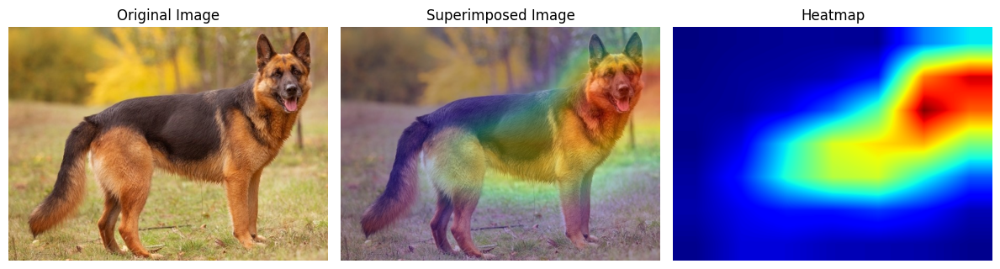

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


<ipython-input-32-809bcc4ed0e3>:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = mpl.cm.get_cmap("jet")


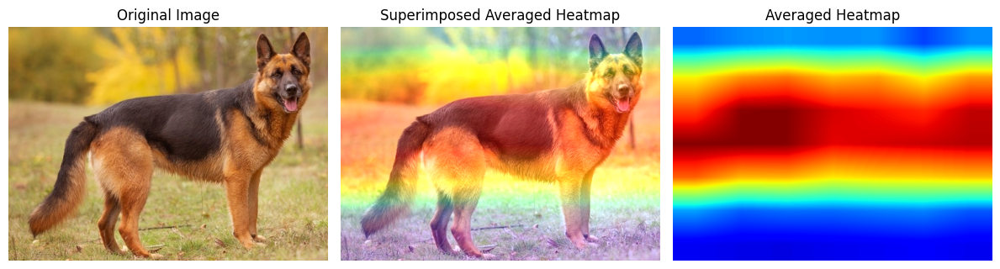

In [ ]:
# Cell 30
import matplotlib.pyplot as plt
from tensorflow.keras.utils import array_to_img

# Function to display both original and zoomed avg results
def display_combined_results(img_path, heatmap, shifted_images):
    # Load original image
    img = load_img(img_path)
    img_array = img_to_array(img)

    # Step 1: Display original Output
    display_all_images(img_path, heatmap)

    # Step 2: Display Shift X Averaged Heatmap
    average_heatmaps_and_apply(shifted_images, img_path)

# Call the function to display all results together
display_combined_results(img_path, heatmap, shifted_images)

# Shift Tranformation Y Axis

In [ ]:
# Cell 30: Y-axis Shift Transformation (Periodic Shift)

import os
import numpy as np
import cv2
from tensorflow.keras.utils import img_to_array, array_to_img, load_img

def shift_y_image_periodic(img_path, shift, save_dir="shifted_y_images"):
    """Applies periodic Y-axis shift to an image."""
    # Load image
    img = load_img(img_path)
    img_array = img_to_array(img)

    # Apply periodic shift using numpy roll along Y-axis
    shifted_img_array = np.roll(img_array, shift, axis=0)  # Shift along Y-axis

    # Convert back to PIL image
    shifted_img = array_to_img(shifted_img_array)

    # Save shifted image
    os.makedirs(save_dir, exist_ok=True)
    save_path = os.path.join(save_dir, f"shifted_y_{shift}.jpg")
    shifted_img.save(save_path)

    return shifted_img, save_path

# Define shift range along Y-axis
shift_values_y = np.arange(-180, 181, 30)  # Shift from -180 to +180 pixels in steps of 30
shifted_y_images = []  # Store (shift, shifted_image, shifted_path)

# Apply periodic shift for each value
for shift in shift_values_y:
    shifted_img, shifted_img_path = shift_y_image_periodic(img_path, shift)
    shifted_y_images.append((shift, shifted_img, shifted_img_path))

print(f"Generated {len(shifted_y_images)} periodically shifted images along the Y-axis.")


Generated 13 periodically shifted images along the Y-axis.


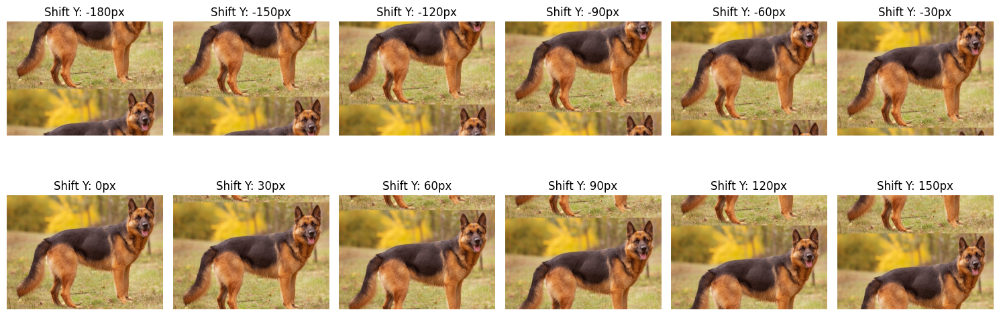

In [ ]:
# Cell 31: Display Periodically Shifted Y-Axis Images

fig, axes = plt.subplots(2, len(shifted_y_images)//2, figsize=(15, 6))

for ax, (shift, shifted_img, _) in zip(axes.flatten(), shifted_y_images):
    ax.imshow(shifted_img)
    ax.set_title(f"Shift Y: {shift}px")
    ax.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


<ipython-input-37-e24821e69ceb>:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = mpl.cm.get_cmap("jet")


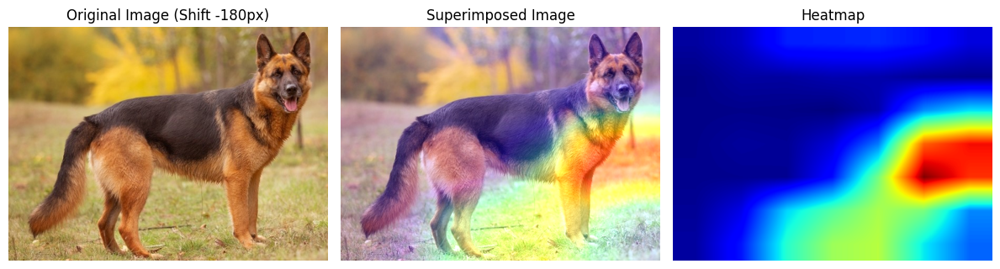

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


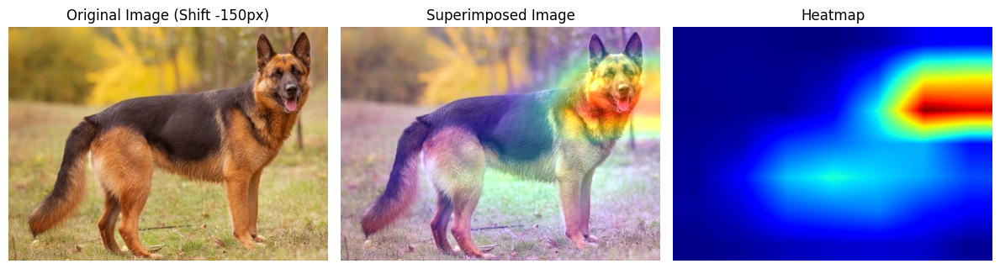

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


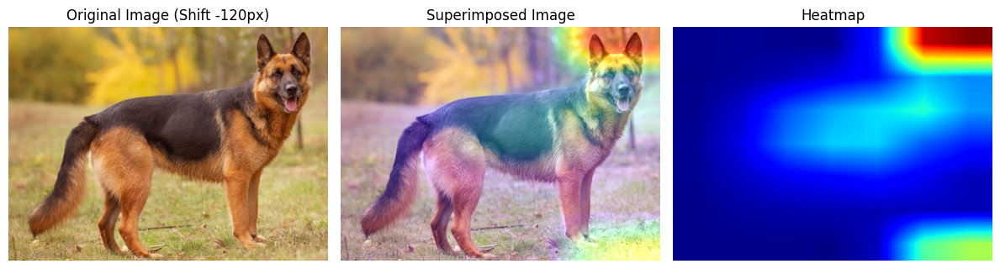

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


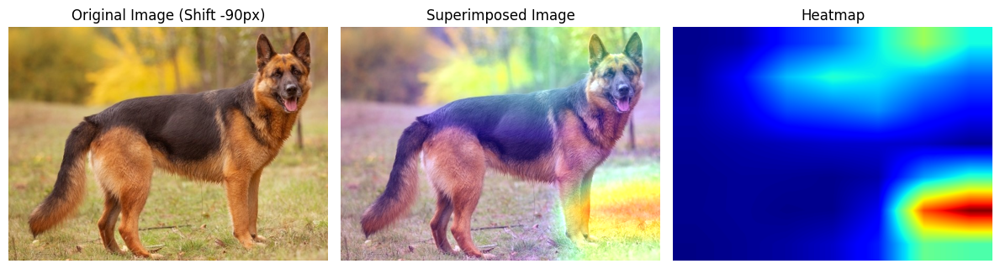

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


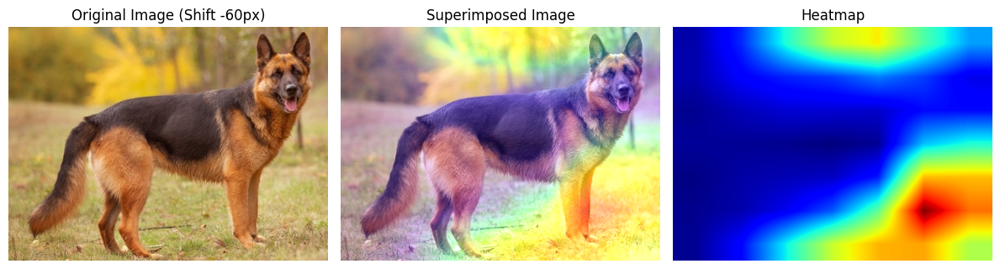

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


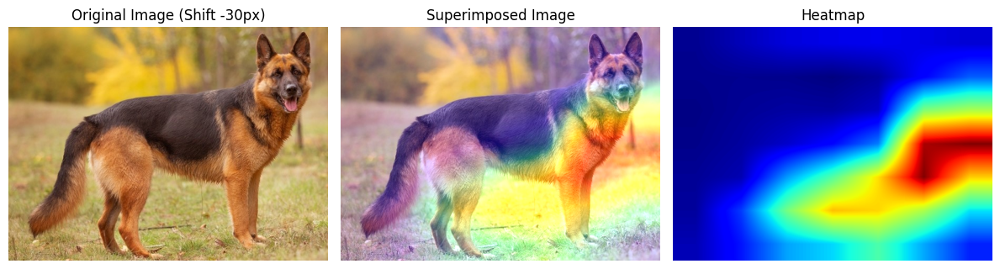

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


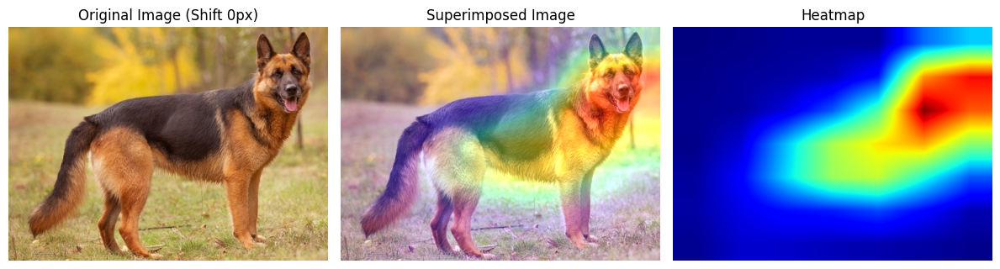

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


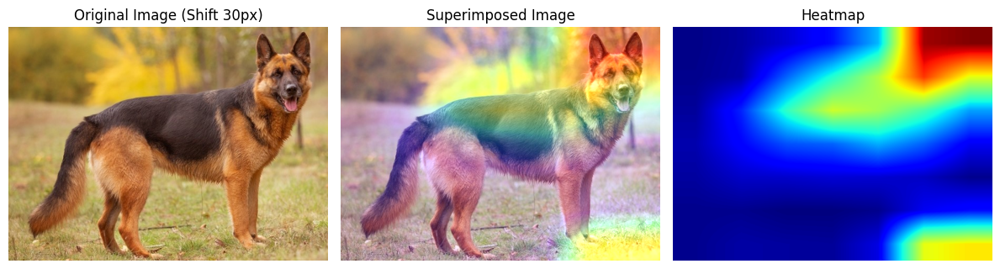

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


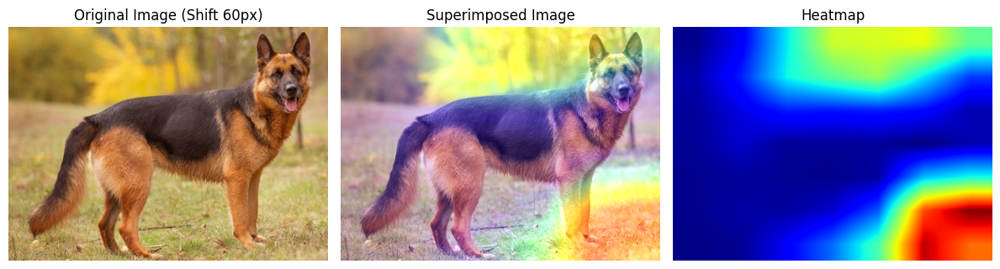

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


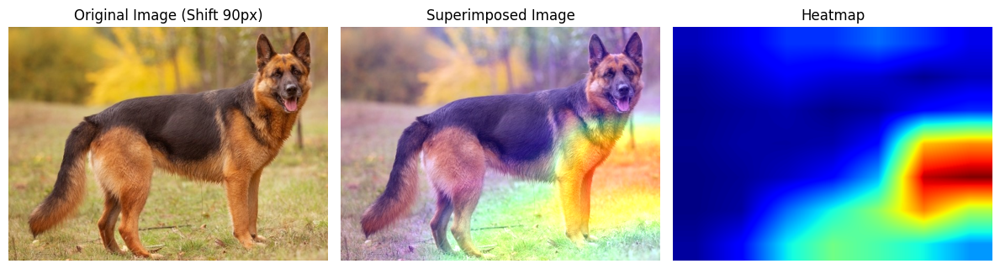

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


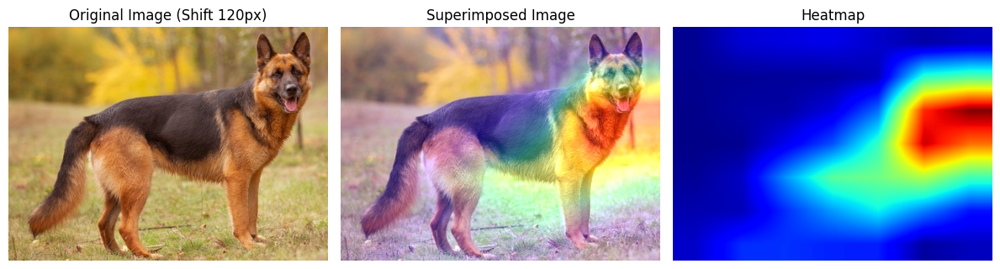

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


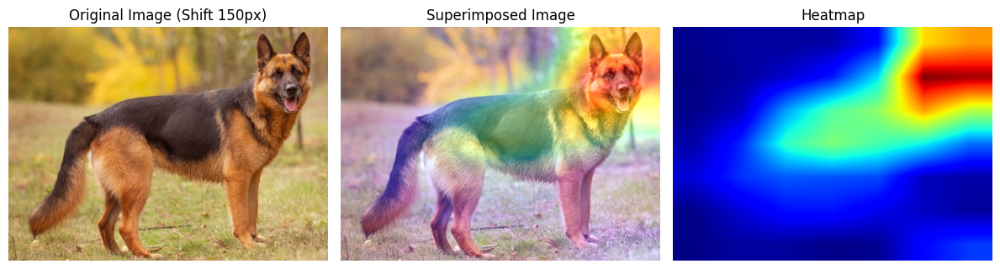

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


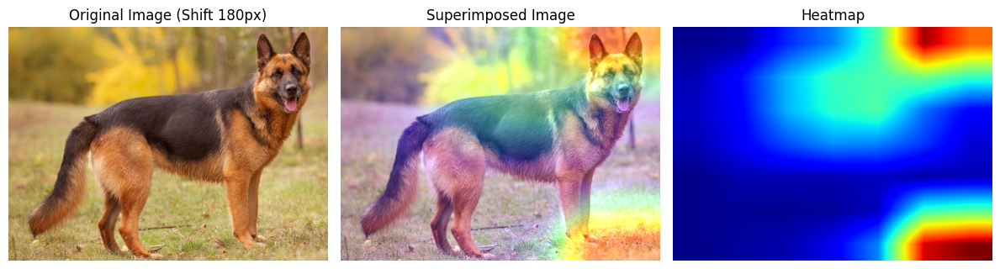

In [ ]:
# Cell 32: Display Periodically Shifted Images with Grad-CAM

import cv2

def display_all_shifted_y_images(shifted_y_images):
    for shift, _, shifted_img_path in shifted_y_images:
        # Load and preprocess the shifted image
        shifted_img_array = preprocess_input(get_img_array(shifted_img_path, size=img_size))

        # Generate predictions
        preds = model.predict(shifted_img_array)
        pred_class = np.argmax(preds[0])  # Get predicted class

        # Generate Grad-CAM heatmap for the predicted class
        heatmap = make_gradcam_heatmap(shifted_img_array, model, last_conv_layer_name, pred_index=pred_class)

        # Shift the heatmap back to original alignment using np.roll for periodic shift along Y-axis
        aligned_heatmap = np.roll(heatmap, -shift, axis=0)

        # Normalize the heatmap properly
        aligned_heatmap = np.maximum(aligned_heatmap, 0)  # Remove negatives
        aligned_heatmap /= np.max(aligned_heatmap) if np.max(aligned_heatmap) > 0 else 1

        # Load original image
        img = keras.utils.load_img(img_path)
        img = keras.utils.img_to_array(img)

        # Resize heatmap to match image size
        heatmap_resized = cv2.resize(aligned_heatmap, (img.shape[1], img.shape[0]))

        # Convert heatmap to proper format for visualization
        heatmap_rescaled = np.uint8(255 * heatmap_resized)

        # Apply proper colormap
        jet = mpl.cm.get_cmap("jet")
        jet_colors = jet(np.arange(256))[:, :3]  # Extract RGB values
        jet_heatmap = jet_colors[heatmap_rescaled]  # Map to colorized heatmap

        # Convert heatmap to PIL image format
        jet_heatmap = keras.utils.array_to_img(jet_heatmap)
        jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
        jet_heatmap = keras.utils.img_to_array(jet_heatmap)

        # **Fix: Ensure correct scaling before overlay**
        superimposed_img = (jet_heatmap * 0.4) + img
        superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

        # Display images side by side
        fig, axes = plt.subplots(1, 3, figsize=(12, 6))

        axes[0].imshow(keras.utils.array_to_img(img))
        axes[0].set_title(f"Original Image (Shift {shift}px)")
        axes[0].axis("off")

        axes[1].imshow(array_to_img(superimposed_img))
        axes[1].set_title("Superimposed Image")
        axes[1].axis("off")

        axes[2].imshow(array_to_img(jet_heatmap))
        axes[2].set_title("Heatmap")
        axes[2].axis("off")

        plt.tight_layout()
        plt.show()

# Call function to display all Y-shifted images with heatmaps
display_all_shifted_y_images(shifted_y_images)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


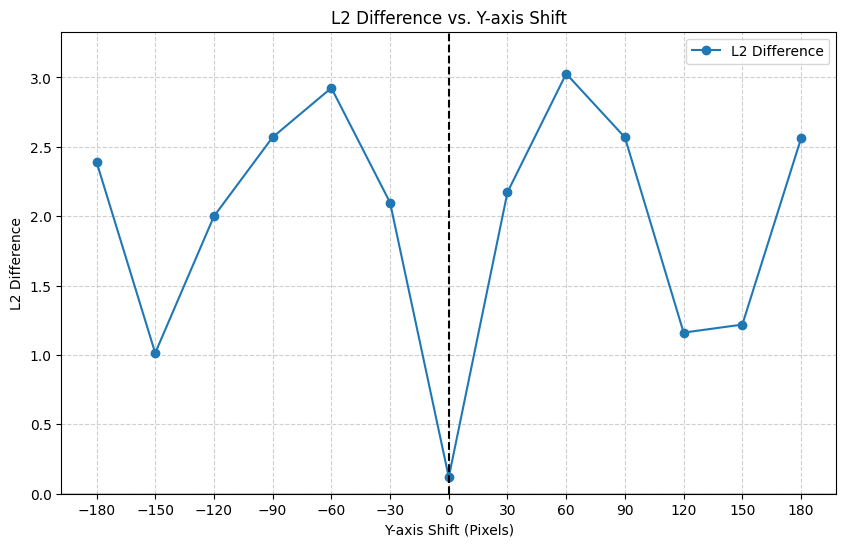

In [ ]:
# Cell 33: Compute L2 Difference Between Shifted and Original Heatmaps

# Compute original heatmap (Baseline without shift)
original_heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=235)  # Horig
original_heatmap = normalize_heatmap(original_heatmap)

# Compute L2 Differences
l2_differences_y = []
shift_values_y = []

for shift, _, shifted_img_path in shifted_y_images:
    # Load and preprocess the shifted image
    shifted_img_array = preprocess_input(get_img_array(shifted_img_path, size=img_size))

    # Generate Grad-CAM heatmap for the predicted class
    preds = model.predict(shifted_img_array)
    pred_class = np.argmax(preds[0])  # Get predicted class
    shifted_heatmap = make_gradcam_heatmap(shifted_img_array, model, last_conv_layer_name, pred_index=pred_class)
    shifted_heatmap = normalize_heatmap(shifted_heatmap)  # Normalize

    # Align shifted heatmap back using np.roll for periodic shift along Y-axis
    aligned_heatmap = np.roll(shifted_heatmap, -shift, axis=0)

    # Ensure heatmap size consistency
    aligned_heatmap = cv2.resize(aligned_heatmap, (original_heatmap.shape[1], original_heatmap.shape[0]))

    # Compute L2 difference
    l2_diff = np.linalg.norm(original_heatmap - aligned_heatmap)
    l2_differences_y.append(l2_diff)
    shift_values_y.append(shift)

# Step 5: Visualize Results - L2 Difference vs Y-axis Shift
plt.figure(figsize=(10, 6))
plt.plot(shift_values_y, l2_differences_y, marker='o', linestyle='-', label='L2 Difference')

plt.xlabel("Y-axis Shift (Pixels)")
plt.ylabel("L2 Difference")
plt.title("L2 Difference vs. Y-axis Shift")
plt.xticks(shift_values_y)
plt.ylim(0, max(l2_differences_y) * 1.1)  # Ensure Y-axis starts at 0
plt.axhline(y=0, color='black', linewidth=1)  # Ground Y-axis at 0
plt.axvline(x=0, color='black', linestyle='--')  # Reference for original shift
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


<ipython-input-40-c11ed2a23b66>:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = mpl.cm.get_cmap("jet")


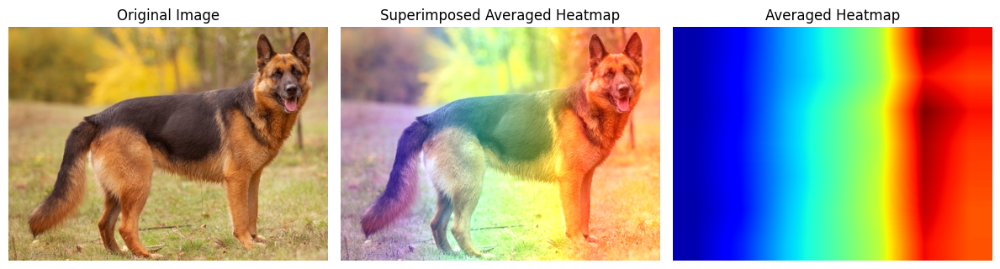

In [ ]:
# Cell 34: Compute Average Heatmaps from Shifted Y-axis Images

import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.utils import img_to_array, array_to_img, load_img

def average_heatmaps_and_apply_y(shifted_y_images, img_path):
    # Load original image
    img = load_img(img_path)
    img_array = img_to_array(img)

    # Initialize accumulator for heatmaps (same size as input image)
    heatmap_accum = np.zeros((img_size[0], img_size[1]), dtype=np.float32)
    count = 0  # Track number of heatmaps

    for shift, _, shifted_img_path in shifted_y_images:
        # Load and preprocess shifted image
        shifted_img_array = preprocess_input(get_img_array(shifted_img_path, size=img_size))

        # Generate predictions
        preds = model.predict(shifted_img_array)
        pred_class = np.argmax(preds[0])  # Get predicted class

        # Generate Grad-CAM heatmap
        heatmap = make_gradcam_heatmap(shifted_img_array, model, last_conv_layer_name, pred_index=pred_class)

        # Align heatmap back using np.roll for periodic shift along Y-axis
        aligned_heatmap = np.roll(heatmap, -shift, axis=0)

        # Resize heatmap to match (224, 224)
        heatmap_resized = cv2.resize(aligned_heatmap, (img_size[1], img_size[0]))

        # Normalize heatmap
        heatmap_resized = np.maximum(heatmap_resized, 0)
        heatmap_resized /= np.max(heatmap_resized) if np.max(heatmap_resized) > 0 else 1

        # Accumulate heatmap
        heatmap_accum += heatmap_resized
        count += 1

    # Compute average heatmap
    average_heatmap = heatmap_accum / count
    average_heatmap /= np.max(average_heatmap) if np.max(average_heatmap) > 0 else 1  # Normalize again

    # Resize heatmap to match original image size
    heatmap_resized = cv2.resize(average_heatmap, (img_array.shape[1], img_array.shape[0]))

    # Apply colormap
    heatmap_rescaled = np.uint8(255 * heatmap_resized)
    jet = mpl.cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap_rescaled]

    # Convert to image
    jet_heatmap = img_to_array(array_to_img(jet_heatmap))

    # Superimpose averaged heatmap on original image
    superimposed_img = (jet_heatmap * 0.4) + img_array
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(12, 6))

    axes[0].imshow(array_to_img(img_array))
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(array_to_img(superimposed_img))
    axes[1].set_title("Superimposed Averaged Heatmap")
    axes[1].axis("off")

    axes[2].imshow(array_to_img(jet_heatmap))
    axes[2].set_title("Averaged Heatmap")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

# Call function to process and display the averaged heatmap
average_heatmaps_and_apply_y(shifted_y_images, img_path)


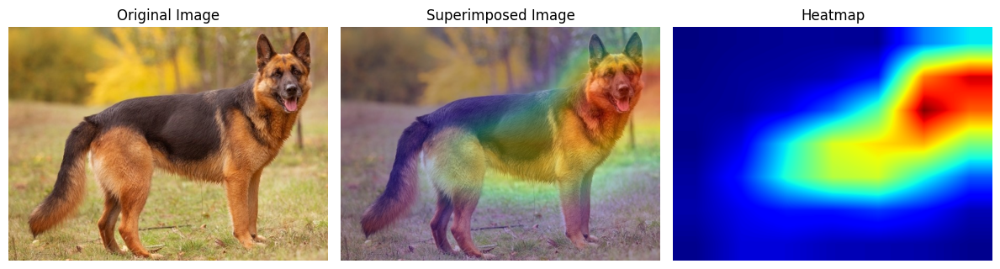

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


<ipython-input-40-c11ed2a23b66>:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = mpl.cm.get_cmap("jet")


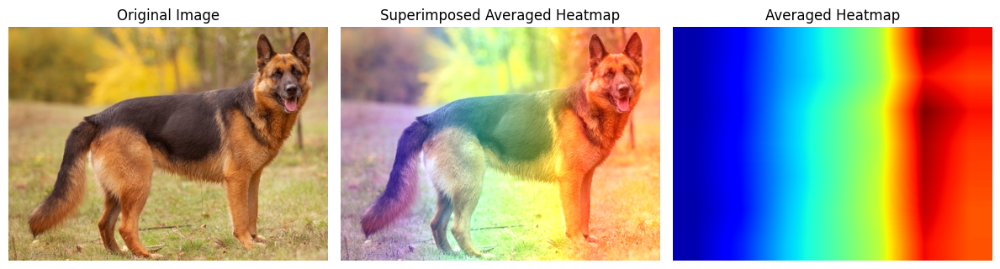

In [ ]:
# Cell 30
import matplotlib.pyplot as plt
from tensorflow.keras.utils import array_to_img

# Function to display both original and zoomed avg results
def display_combined_results(img_path, heatmap, shifted_y_images):
    # Load original image
    img = load_img(img_path)
    img_array = img_to_array(img)

    # Step 1: Display original Output
    display_all_images(img_path, heatmap)

    # Step 2: Display Shift Y Averaged Heatmap
    average_heatmaps_and_apply_y(shifted_y_images, img_path)

# Call the function to display all results together
display_combined_results(img_path, heatmap, shifted_y_images)